# Examples for Manuscript

**Libraries**

In [1]:
from SpykFunctions import *
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 600

In [2]:
# List files
images_path = r'./OldFiles/CVATLabeling/PGRRoseau_JON/images/default'
Images = ListImages(images_path, imgformat=".tif", recursive=False)

In [3]:
# Sample image
img = plt.imread(Images[7])
# plt.imshow(img)

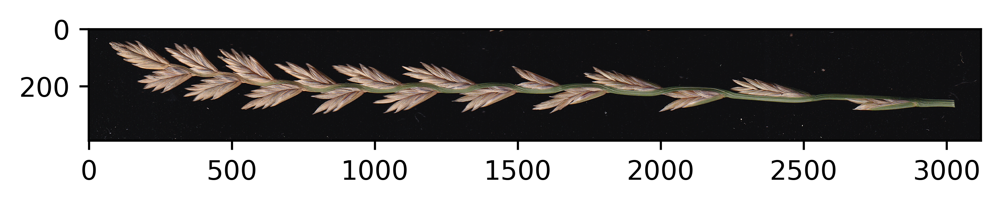

In [5]:
# img0 = img[3000:4100, 10:3700, :]
img0 = img[6540:6930, 180:3300, :]
# img0 = img[3500:6930, 3900:4400, :]   # Vertical spike

plt.imshow(img0)

## OtsuScaling

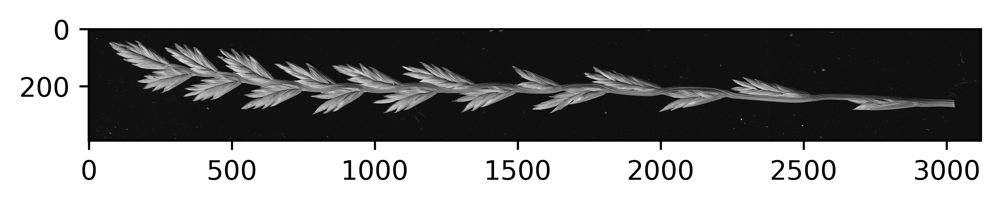

In [6]:
# Convert to gray
gray0 = img0 @ [0.2126, 0.7152, 0.0722]
plt.imshow(gray0, cmap='gray')

In [7]:
# Set image threshold
T = filters.threshold_otsu(gray0)

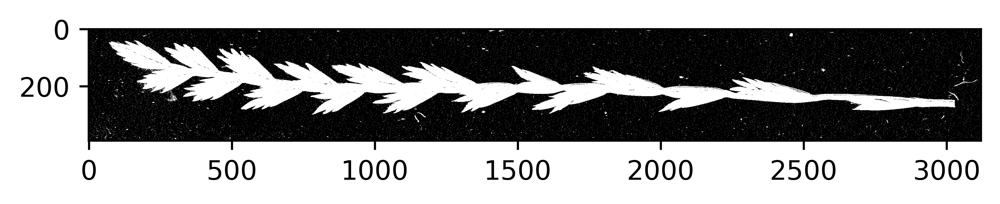

In [8]:
# Segment gray image
bw0 = gray0 > T*0.25
plt.imshow(bw0, cmap='gray')

In [10]:
%%time
I = spike_segm(img0, OtsuScaling=0.3, rgb_out=True, gray_out=True, lab_out=True, hsv_out=True, bw_out=True)
rgb0 = I[0]
gray0 = I[1]
lab0 = I[2]
hsv0 = I[3]
bw0 = I[4]

CPU times: total: 625 ms
Wall time: 624 ms


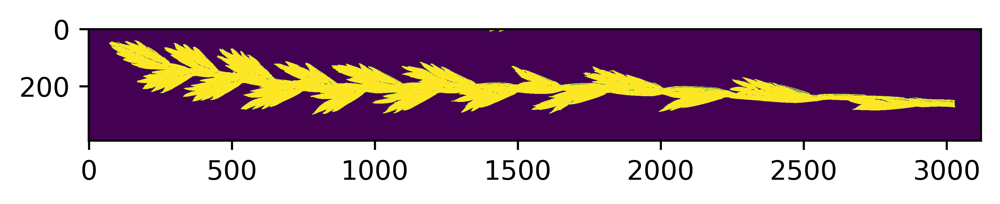

In [11]:
# plt.imshow(hsv0)
plt.imshow(bw0)

## PixelHist

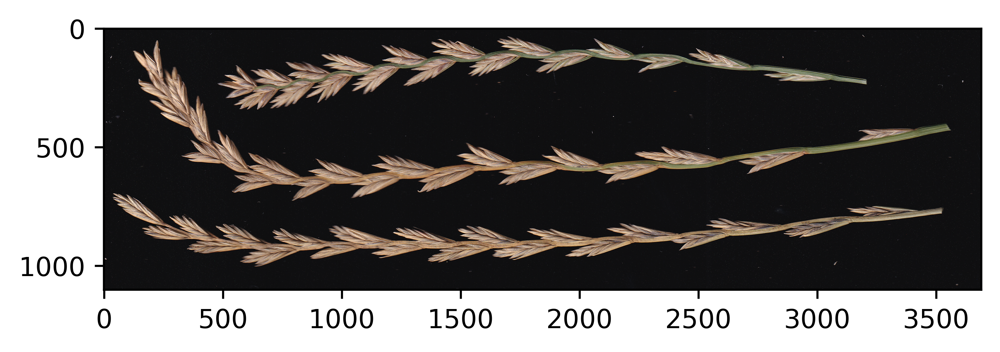

In [110]:
# img0 = img[6550:6930, 180:3300, :]      # Single spike

# img0 = img[5855:6930, 180:3660, :]
img0 = img[3000:4100, 10:3700, :]


plt.imshow(img0)

In [111]:
%%time
I = RemoveBackground(img0, OtsuScaling=0.3, rgb_out=True, gray_out=True, lab_out=True, hsv_out=True, bw_out=True)
rgb0 = I[0]
gray0 = I[1]
lab0 = I[2]
hsv0 = I[3]
bw0 = I[4]

CPU times: user 2.15 s, sys: 409 ms, total: 2.56 s
Wall time: 1.14 s


In [ ]:
rotated_rgb0 = ndimage.rotate(rgb0, 270, reshape=True)

plt.imshow(rotated_rgb0)

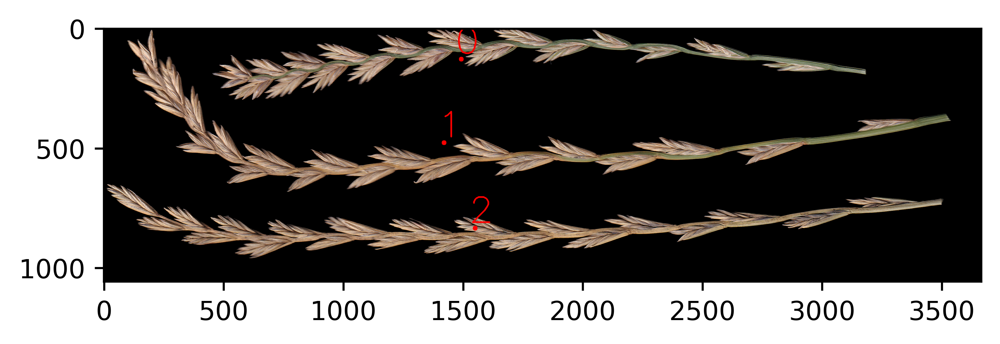

In [53]:
EnumerateSpkCV(bw0, rgb0, TextSize=5, TROE2020=False)

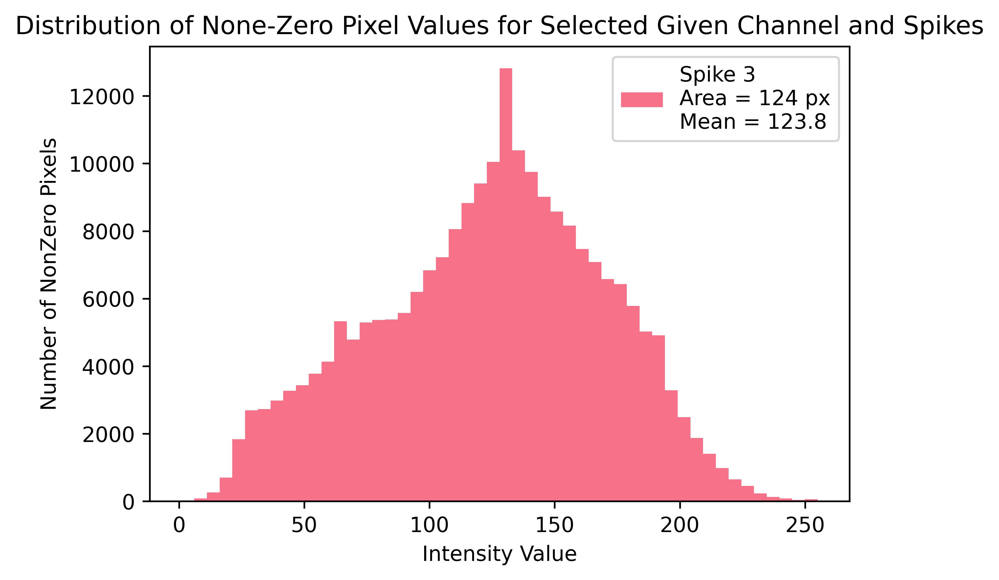

In [23]:
# PixelHist(bw=bw0, ColorSpace=lab0, channel = 0, spikes=[0,1,2], nbins = 100)
PixelHist(bw=bw0, ColorSpace=rgb0, channel = 1, spikes=[3], nbins = 50)

In [ ]:
PixelHist(bw=bw0, ColorSpace=lab0, channel = 1, spikes=[0,1,2], nbins = 25)

In [ ]:
img0 = img[6540:6930, 180:3300, :]
plt.imshow(img)

## SpikesDF

In [151]:
df = SpikesDF(I, ImagePath=Images[7], RemoveBG=False, PrintSpkLabels=False)

In [208]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
df_std = df.iloc[:,2:]
scaler = StandardScaler()
x_scaled = scaler.fit_transform(df_std)
df_std = pd.DataFrame(x_scaled, columns=df.columns[2:], index=df.index)

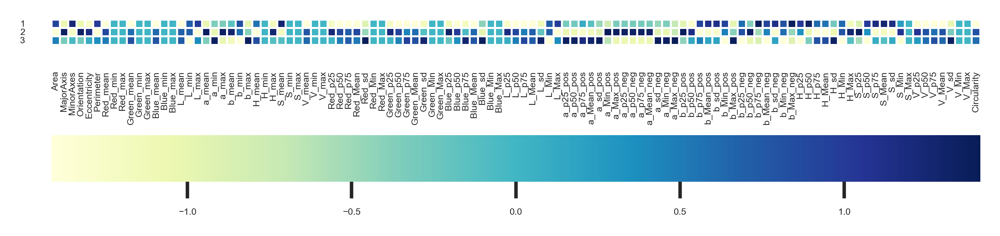

In [209]:
sns.set(font_scale=0.3)
ax = sns.heatmap(df_std, linewidths=.5,
                 cmap='YlGnBu',
                 xticklabels=list(df_std.columns),
                 yticklabels=df.Spike_Label,
                 cbar_kws={"orientation": "horizontal"})
plt.yticks(rotation=0) 
ax.set_aspect("equal")

In [ ]:
# sns.set(font_scale=0.3)
# ax = sns.heatmap(pca.components_, linewidths=.5,
#                  cmap='YlGnBu',
#                  xticklabels=list(X.columns),
#                  yticklabels=xLabels,
#                  cbar_kws={"orientation": "horizontal"})
# plt.yticks(rotation=0) 
# ax.set_aspect("equal")

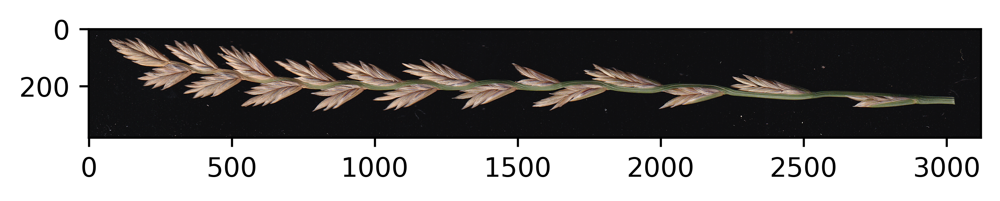

In [34]:
img0 = img[6550:6930, 180:3300, :]
# img0 = img[6540:6930, 180:3300, :]
plt.grid(False)
plt.imshow(img0)


In [109]:
%%time
I = RemoveBackground(img0, Crop=False,OtsuScaling=0.3, rgb_out=True, gray_out=True, lab_out=True, hsv_out=True, bw_out=True)
rgb0 = I[0]
gray0 = I[1]
lab0 = I[2]
hsv0 = I[3]
bw0 = I[4]

CPU times: user 2.19 s, sys: 485 ms, total: 2.68 s
Wall time: 1.35 s


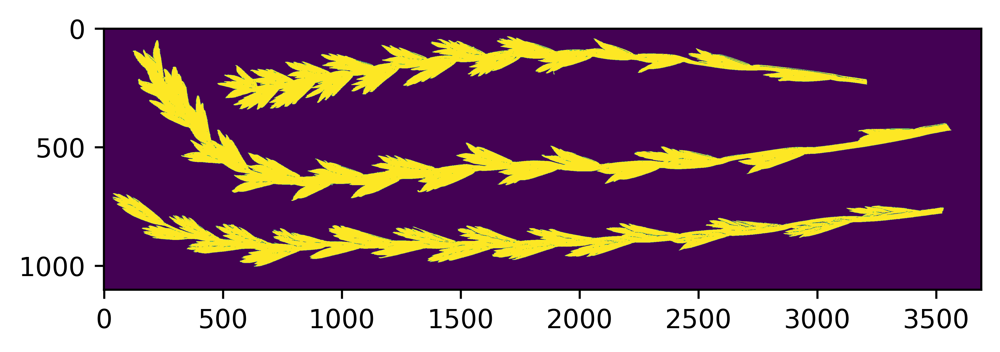

In [108]:
plt.imshow(bw0)

## SpykLength

In [48]:
%%time
# img0 = img[5855:6930, 180:3660, :]
img0 = img[3000:4100, 10:3700, :]



# plt.imshow(img0)

I = RemoveBackground(img0, OtsuScaling=0.3, rgb_out=False, 
                     gray_out=False, lab_out=False, hsv_out=False, bw_out=True)
bw0 = I[0]
labeled_spks, num_spikes = label(bw0, return_num = True)

SpkLengths = pd.DataFrame()

# Start at 1 so it ignores background (0) 
for Label in range(1, num_spikes+1):

    spk = labeled_spks==Label
    # io.imshow(spk)

    # Crop spike
    slice_x, slice_y = ndimage.find_objects(spk)[0]
    cropped_spk = spk[slice_x, slice_y]

    # Spike length
    sl,_ = spk_length(cropped_spk, Method='all', Overlay=False)
    SpkLengths = pd.concat([SpkLengths,sl], axis=0)

CPU times: user 5.12 s, sys: 1.34 s, total: 6.45 s
Wall time: 2.65 s


In [ ]:
%%time

path = r'./Images/PGR_Roseau2021'
# path = r'./Images/TROE2021'
# path = r'./Images/PGR_GH2021'
# path = r'./Images/LaptopTest'
Images = ListImages(path, imgformat=".tif", recursive=False)

Lengths, Time = LengthBatch(Images)
# Lengths.to_csv('temp.csv')
# Time.to_csv('temp.csv')
# Wall time: 23min 12s


In [ ]:
# SL = spk_length(bw0, method='skelblur', Overlay=True, PlotCH=False)
# SL = spk_length(bw0, Method='skel',Overlay=True)
SL = spk_length(bw0, Method='skel_ma',Overlay=True)



# plt.grid(False)


## SpkltThresh

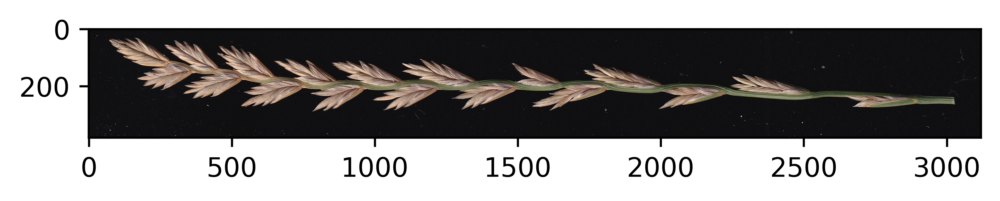

In [15]:
img0 = img[6550:6930, 180:3300, :]
# img0 = img[6540:6930, 180:3300, :]
# plt.grid(False)
plt.imshow(img0)


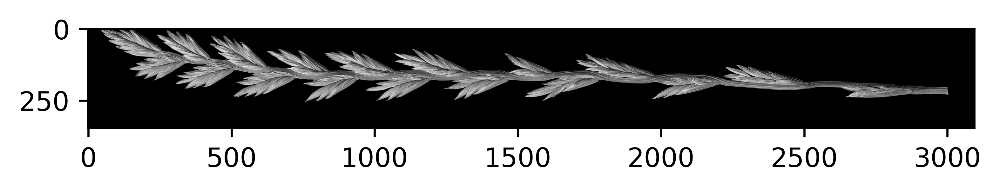

In [13]:

cropped = rgb0
# plt.imshow(cropped)
ResizeFactor=30
thr2=0.8
MinSize=1000  

# Check that it's a gray image
if len(cropped.shape) > 2:
    # Convert to gray
    cropped_gray = color.rgb2gray(cropped)
else:
    cropped_gray = cropped

plt.imshow(cropped_gray, cmap='gray')



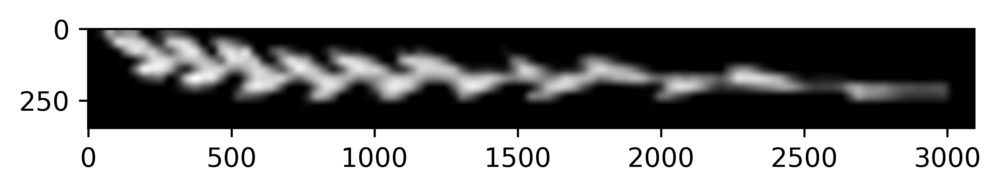

In [14]:

# Reduce image size
im = Image.fromarray((cropped_gray*255).astype(np.uint8))
(width, height) = (im.width // ResizeFactor, im.height // ResizeFactor)
rescaled_spk = im.resize((width, height))

# Increase to original size
(width, height) = (im.width, im.height)
rescaled_spk = rescaled_spk.resize((width, height))
rescaled_spk = np.asarray(rescaled_spk)

plt.imshow(rescaled_spk, cmap='gray')

# Example:
# thresh2 = SpkltThresh(cropped=cropped_rgb, ResizeFactor=30, thr2=0.8, MinSize=1000)
# plt.imshow(thresh2)

In [63]:
# Histogram equalization
rescaled_spk = exposure.equalize_hist(rescaled_spk)
# plt.imshow(rescaled_spk, cmap='gray')


# Blur with a Gaussian
blurred = filters.gaussian(rescaled_spk, sigma=1, preserve_range=True)
# plt.imshow(blurred, cmap='gray')

# # Adaptative equalization
blurred = exposure.equalize_adapthist(blurred)
# plt.imshow(blurred, cmap='gray')

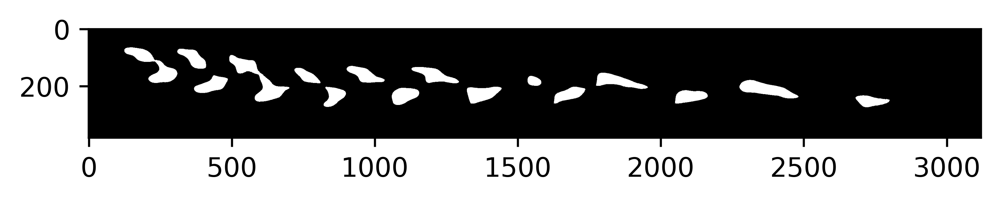

In [64]:

# Normalize
blurred = cv2.normalize(blurred, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
blurred = blurred.astype(np.uint8)

if thr2 < 1 == True:
    thr2 = thr2*255
else:
    thr2 = thr2

# Threshold at given %
ret, thresh = cv2.threshold(blurred, thr2, 255, 0)
thresh = np.uint8(thresh)

nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
sizes = stats[1:, -1]; nb_components = nb_components - 1    

thresh2 = np.zeros((output.shape))

# Keep only objects with minimum size
for i in range(0, nb_components):
    if sizes[i] >= MinSize:
        thresh2[output == i + 1] = 255

#     plt.imshow(thresh2)
thresh2 = np.uint8(thresh2)

plt.imshow(thresh2, cmap='gray')

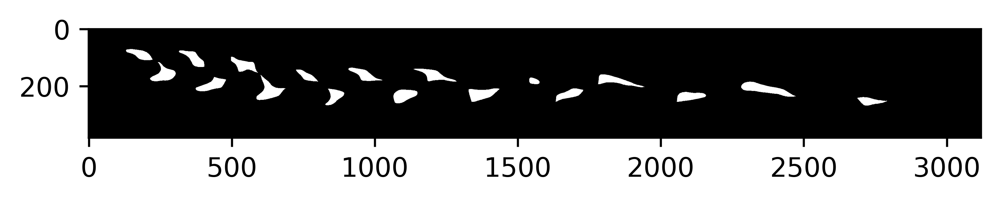

In [182]:
kernel = morphology.disk(3)
eroded = cv2.erode(thresh2, kernel, iterations=2)
plt.imshow(eroded, cmap='gray')

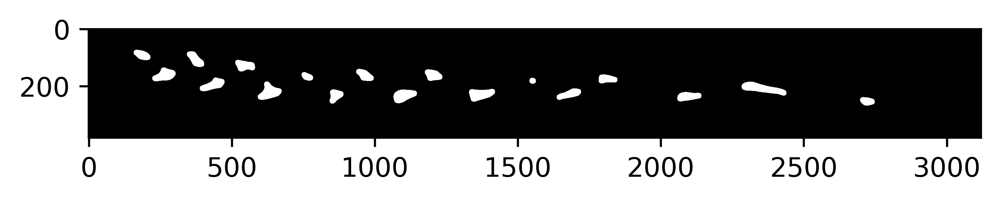

In [183]:
se = morphology.disk(10)
mask = ndimage.binary_opening(eroded, se)
plt.imshow(mask, cmap='gray')

## Contours

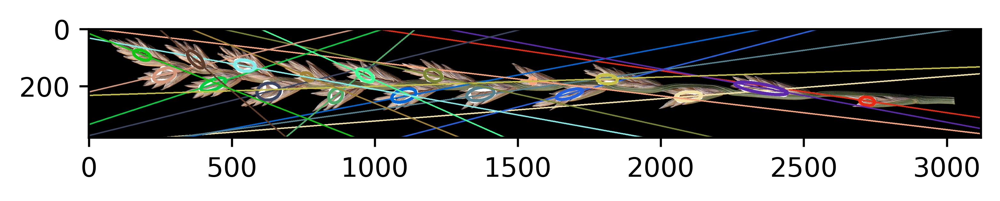

In [117]:
mask2 = np.uint8(mask)
# Contours
labels_cont = CountorProps(rgb0, lab0, hsv0, mask2, ImagePath=Images[7], ResizeFactor=30, MinSize = 1000, thr2=0.8, plot=True)
# Add spike label
# labels_cont['Spike_Label'] = [str(Label)] * len(labels_cont)

## Spikelets (Watershed)


In [127]:

# cropped_rgb = rgb0
# MinDist=50
# plot_ellipse=True
# plot_segmented=False
# Pad = 200
# Numbered = True
# data_out=True

def LabelSpklts(cropped_rgb,Pad=200,MinDist=50,data_out=True,plot_ellipse=False,
                Numbered=False,img_out=False,plot_segmented=False):

    # Add pad - improves segmentation
    padded_rgb = np.pad(cropped_rgb, pad_width=[(Pad, Pad),(Pad, Pad),(0, 0)], mode='constant')
    # Rescale to 10% of original
    rescaled_spk = rescale(padded_rgb[...], 0.1, preserve_range=False, channel_axis=2, anti_aliasing=True)
    # Erosion
    kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
    erosion = cv2.erode(rescaled_spk,kernel,iterations = 1)
    # Opening
    kernel = np.ones((1,1),np.uint8)
    opening = cv2.morphologyEx(erosion, cv2.MORPH_OPEN, kernel, iterations = 10)
    # Resize to original
    rescaled_spk2 = Image.fromarray((rescaled_spk * 255).astype(np.uint8))
    rescaled_spk2 = rescaled_spk2.resize((padded_rgb.shape[1],padded_rgb.shape[0]))
    # Opening
    opening = np.asarray(rescaled_spk2)
    # Convert rgb to gray
    gray_spklts = opening @ [0.2126, 0.7152, 0.0722]
    # Binarize gray (threshold may vary according to spike and background colors)
    bw_spklts = gray_spklts > 50
    # Get distances
    distance = ndi.distance_transform_edt(bw_spklts)
    # plt.imshow(-distance)
    # Get max peaks
    coords = peak_local_max(distance, min_distance=MinDist, labels=bw_spklts)
    # Create mask
    mask = np.zeros(distance.shape, dtype=bool)
    mask[tuple(coords.T)] = True
    # Label
    markers, spikelets = ndi.label(mask)
    # Watershed
    labels = watershed(-distance, markers, mask=bw_spklts)
    labels2 = np.unique(labels[labels > 0])

    # Contours for segmented spikelets (C)
    C = []
    for Label in labels2:
            y = labels == Label
            y = y * 255
            y = y.astype('uint8')
            contours, hierarchy = cv2.findContours(y, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            # len(contours)
            contours = np.squeeze(contours)
            C.append(contours)
    #         plt.imshow(y)

    contours = C

    # Export angles and areas (if requested)
    if data_out==True:
        
        EllipsesIndex = []
        EllipsesAngle = []
        EllipsesArea = []

        if plot_ellipse==True:
            OutImage = padded_rgb.copy()
            # Plot all found contours
            # OutImage = cv2.drawContours(OutImage, contours, -1, (0,0,0), 10);

        ellipse_ind = 0
        for c in contours:
            ellipse_ind = ellipse_ind + 1
            # Generate random colors

            random_channels = (np.random.choice(range(50,256), size=3))
            rr = int(random_channels[0])
            rg = int(random_channels[1])
            rb = int(random_channels[2])

            # Fit elipse and line
            # Source: https://stackoverflow.com/questions/62698756/opencv-calculating-orientation-angle-of-major-and-minor-axis-of-ellipse
            ellipse = cv2.fitEllipse(c)
            (xc,yc),(d1,d2),angle = ellipse
            rmajor = max(d1,d2)/2

            if angle > 90:
                angle = angle - 90
            else:
                angle = angle + 90

            xtop = xc + math.cos(math.radians(angle))*rmajor
            ytop = yc + math.sin(math.radians(angle))*rmajor
            xbot = xc + math.cos(math.radians(angle+180))*rmajor
            ybot = yc + math.sin(math.radians(angle+180))*rmajor

            ellipse_area = np.pi * d1 * d2
            EllipsesIndex.append(ellipse_ind)
            EllipsesAngle.append(angle)  
            EllipsesArea.append(ellipse_area)

            if plot_ellipse==True:
                OutImage = cv2.ellipse(OutImage,ellipse,(rr,rg,rb),3);
                cv2.line(OutImage, (int(xtop),int(ytop)), (int(xbot),int(ybot)), (rr,rg,rb), 3)

            if Numbered == True:
                cv2.putText(OutImage, str(ellipse_ind), (int(xc) - 25, int(yc) - 25),
                            cv2.FONT_HERSHEY_SIMPLEX, 2, (rr,rg,rb), 5)

        # Dataframe for data
        EllipsesData = pd.DataFrame({'Ellipse_Number':EllipsesIndex,
                                 'Ellipse_Angle':EllipsesAngle,
                                 'Ellipse_Area':EllipsesArea})        
        if img_out==True:
            return(EllipsesData, spikelets, OutImage)
        else:
            return(EllipsesData, spikelets)

    if plot_segmented==True and plot_ellipse==False:  
        plt.imshow(labels, cmap=plt.cm.nipy_spectral)
        print('Detected spikelets = ', spikelets)
    
# Example:
Spikelets, Number, Spikelets_Image  = LabelSpklts(cropped_rgb=rgb0,Pad=200,MinDist=50,data_out=True,
                              plot_ellipse=True,Numbered=True,img_out=True,plot_segmented=False)

In [100]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2)
kmeans.fit(np.asarray(Slopes).reshape(-1, 1))
# kmeans.labels_




KMeans(n_clusters=2)

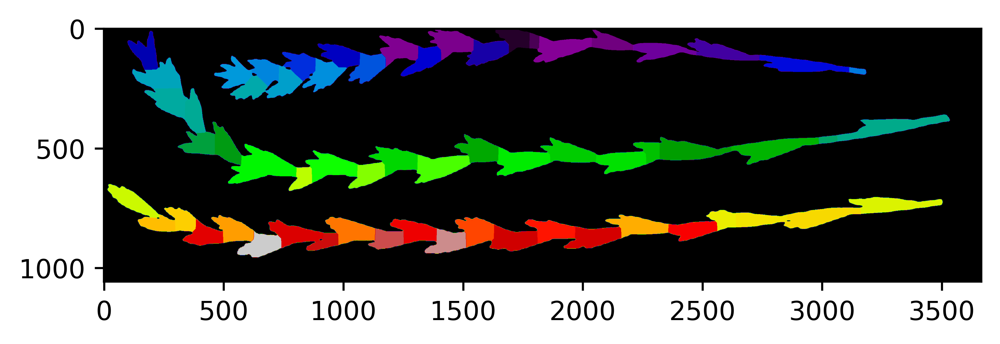

In [57]:
# plt.imshow(opening)
# plt.imshow(bw_spklts, cmap='gray')
# plt.imshow(-distance, cmap='gray')
plt.imshow(labels, cmap=plt.cm.nipy_spectral)

In [22]:
plt.imshow(OutImage)

NameError: name 'OutImage' is not defined

## Distances 

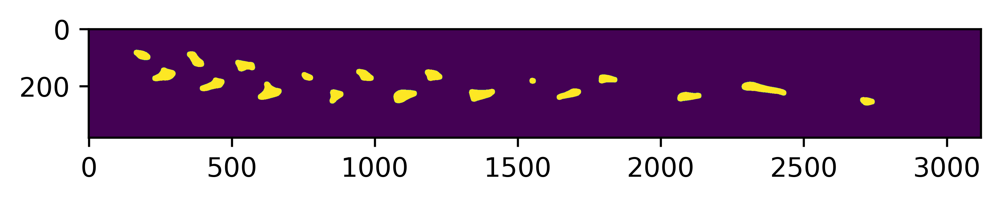

In [184]:
plt.imshow(mask)

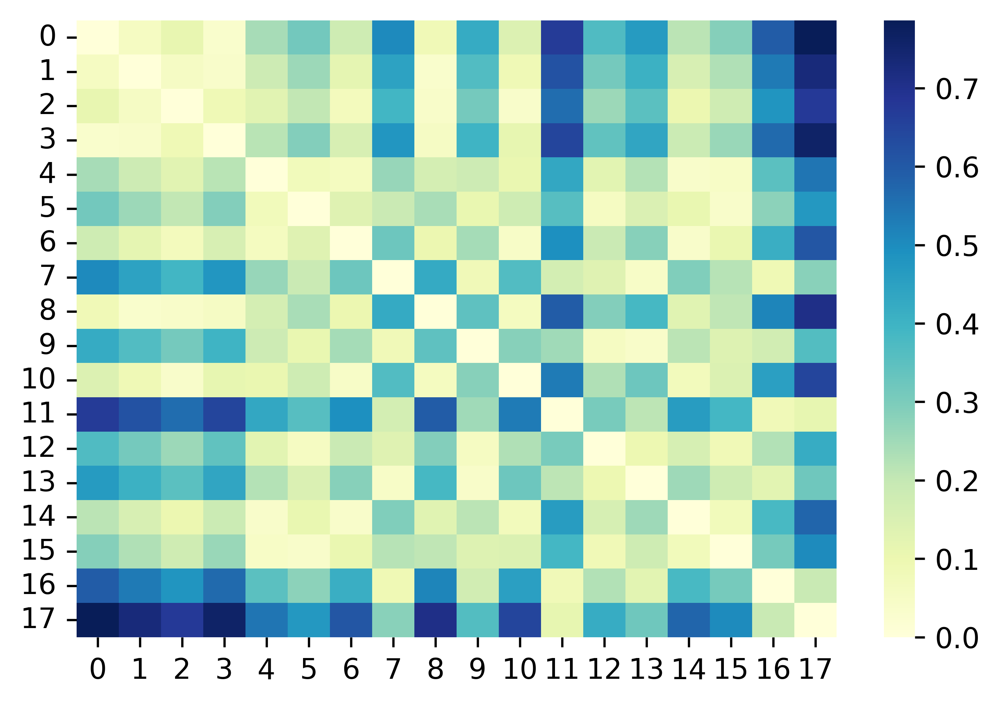

In [187]:

def DistAll(bw, HeatMap=True, HeatMapOut=False, spike_length=None):
    
    nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(np.uint8(bw), 
                                                                               connectivity=8)
    # len(centroids[1:][:])
    img_center = centroids[0][:]
    c_points = centroids[1:][:]
    c_df = pd.DataFrame(c_points, columns=["x","y"])
    # c_df

    # https://stackoverflow.com/questions/57107729/how-to-compute-multiple-euclidean-distances-of-all-points-in-a-dataset

    # Consider points as tuples in a list
    data = [ (float(x),float(y)) for x,y in c_df[['x', 'y']].values ]

    # Create empty list for distances
    distances = []

    for point in data:

        # Compute the Euclidean distance between the current point and all others
        euc_dist = [math.sqrt((point[0]-x[0] )**2 + (point[1]-x[1])**2) for x in data]

        # Append to list
        distances.append(euc_dist)

    # Convert list to array
    D = np.array(distances)
    
    if spike_length != None:
        # Express it as a fraction from spike length
        D = D/spike_length
    else:
        D = D
    
    # Heatmap
    if HeatMap==True:
        sns.heatmap(D, cmap='YlGnBu')
    
    if HeatMapOut==True:
        hm = sns.heatmap(D, cmap='YlGnBu')
        return D, hm
    else:
        return D

# Example:
D = DistAll(bw=mask, HeatMap=True, spike_length=SL)
# D, hm = DistAll(bw=thresh2, HeatMap=False, HeatMapOut=True, spike_length=SL)
# D = DistAll(bw=spklts, HeatMap=True, spike_length=SL)


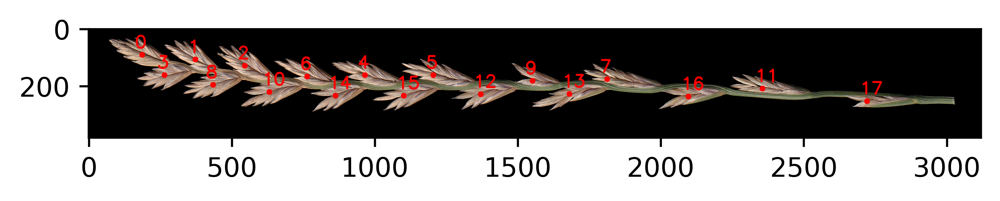

In [228]:
EnumPlot = EnumerateSpkCV(mask, rgb0, TextSize=2, TROE2020=False, Plot=False, PlotOut=True)
plt.imshow(EnumPlot)

In [227]:
def EnumerateSpkCV(bw, rgb, TextSize=5, TROE2020=False, Plot=True, PlotOut=False):
    
    nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(np.uint8(bw), connectivity=8)
    img = rgb.copy()
    
    # ignore the background (centroid 0)
    centroids = centroids[1:]
    
    if TROE2020==True:
        counter=-1
    else:
        counter=0

    for c in centroids:
#         print(c)
        cx = round(c[0])
        cy = round(c[1])
        img = cv2.circle(img, (cx, cy), 10, (255, 0, 0), -1)
        img = cv2.putText(img, str(counter), (cx - 25, cy - 25),cv2.FONT_HERSHEY_SIMPLEX, TextSize, (255, 0, 0), 5)
        counter = counter+1
    
    if Plot==True:
        plt.imshow(img)
    
    if PlotOut==True:
        return img

In [200]:
bw = mask
rgb = rgb0

In [ ]:
from pathlib import Path
Path("/my/directory").mkdir(parents=True, exist_ok=True)

# Elliptical Fourier Descriptors

In [12]:
import spatial_efd

In [13]:
bw = np.pad(bw0, pad_width=[(100, 100),(100, 100)], mode='constant')

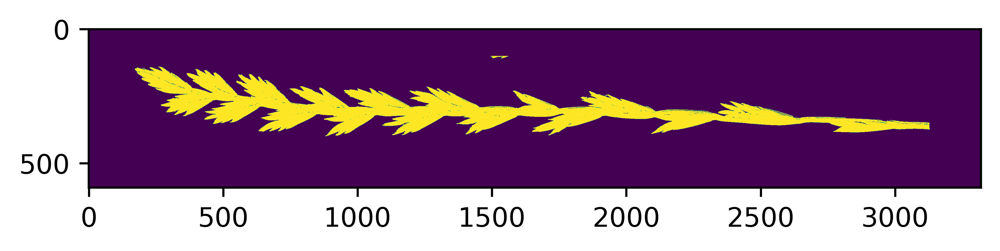

In [14]:
# plt.imshow(bw)

### Fill holes

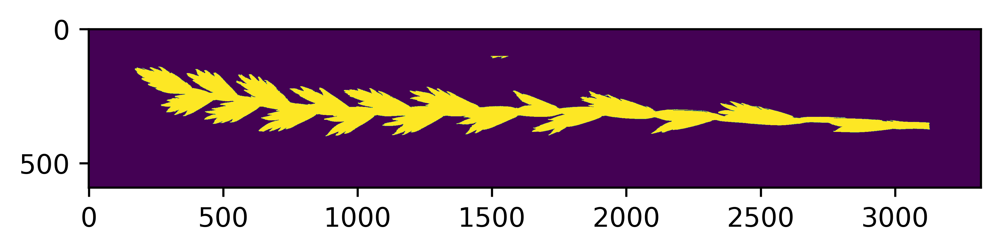

In [15]:
bw = ndimage.binary_fill_holes(bw)
bw = np.uint8(bw)
plt.imshow(bw)

In [16]:
contour, hierarchy = cv2.findContours(bw,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_NONE)
contour = np.squeeze(contour)
len(contour)

C:\Users\jbarreto\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


2

In [17]:
x = contour[:,0]
y = contour[:,1]
harmonics=10

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [24]:
coeffs = spatial_efd.CalculateEFD(x,y,harmonics)
# coeffs

In [ ]:
# Plot for paper

In [ ]:
harmonic = 1000
coeffs = spatial_efd.CalculateEFD(x, y, harmonic)
# size_invariant must be set to false if a normalized Fourier ellipse
# is to be plotted alongside the shapefile data
coeffs, rotation = spatial_efd.normalize_efd(coeffs, size_invariant=False)
ax = spatial_efd.InitPlot()
spatial_efd.plotComparison(ax, coeffs, harmonic, x, y, rotation=rotation,
                          color1 = 'red', width1 = 2,
                          color2 = 'black', width2 = 0.5)


In [ ]:
# Power

In [568]:
f = np.fft.fft2(bw)
fshift = np.fft.fftshift(f)
mag_spec = 20*np.log(np.abs(fshift))
mag_spec = np.asarray(mag_spec, dtype=np.uint8)

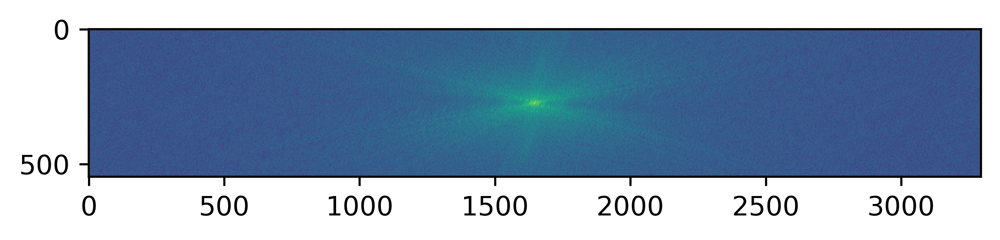

In [569]:
plt.imshow(mag_spec)

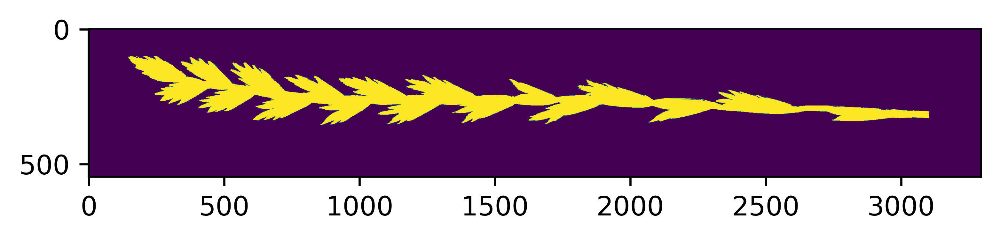

In [561]:
plt.imshow(bw)